In [3]:
import sys
sys.path.append('/integrai')
import numpy as np
import os
from collections import Counter
import torch
import json
from PIL import Image
import openai
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import requests
import pandas as pd
from integrai.integrai import *
from integrai.embedding_funcs import *
from integrai.utils import *

/home/codespace/.python/current/lib/python3.10/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


Let us download data for this demo - if instead you want to see how we created this data see demo_data/demo_iamgenet_createdata.ipynb

In [4]:
link_df = "https://storage.googleapis.com/public-research-data-mozannar/imagenet_df_data.csv"
link_images = "https://storage.googleapis.com/public-research-data-mozannar/imagenet_mini_imgs.zip"

def download_file(link, dir = "."):
    response = requests.get(link)
    if response.status_code == 200:
        name = dir +"/" + link.split("/")[-1]
        with open(name, 'wb') as f:
            f.write(response.content)
        print(f"File '{name}' downloaded successfully!")
    else:
        print("Failed to download the file.")

download_file(link_df, dir = ".")
download_file(link_images, dir = ".")

!unzip -q imagenet_mini_imgs.zip
df_data = pd.read_csv("imagenet_df_data.csv")
image_embeddings = []
for i in range(len(df_data)):
    array_str = df_data['image_embeddings'][i]
    array_elements = array_str.strip('[]').split()
    array = np.array([float(element) for element in array_elements])
    image_embeddings.append(array)
df_data['image_embeddings'] = image_embeddings

df_data.head()

File './imagenet_df_data.csv' downloaded successfully!
File './imagenet_mini_imgs.zip' downloaded successfully!
replace val/n01440764/ILSVRC2012_val_00009111.JPEG? [y]es, [n]o, [A]ll, [N]one, [r]ename: 

^C


,Unnamed: 0,labels,img_path,label,preds,captions,image_embeddings
0,0,0,val/n02979186/n02979186_8971.JPEG,cassette player,0,an image of a black and silver speaker,"[-0.0109331943, -0.0426749438, -0.0171274133, ..."
1,1,0,val/n02979186/n02979186_14550.JPEG,cassette player,4,an image of a car dashboard with a steering,"[0.0148604633, 0.0421392582, 0.00229643472, -0..."
2,2,0,val/n02979186/n02979186_11971.JPEG,cassette player,0,an image of three different radios,"[-0.000195962159, 0.0141781829, -0.0445918031,..."
3,3,0,val/n02979186/n02979186_11550.JPEG,cassette player,0,an image of a radio on a table,"[-0.00644767238, -0.00524553005, -0.0559504069..."
4,4,0,val/n02979186/n02979186_8751.JPEG,cassette player,0,an image of a stereo system,"[0.00262349378, 0.0200760905, 0.00258200639, 0..."


The data is the validation set of imagenette https://github.com/fastai/imagenette which consists of images, each belonging to one of 10 classes

We will consider the AI to be ResNet18, pre-trained on ImageNet (resnet18(weights="ResNet18_Weights.IMAGENET1K_V1") )

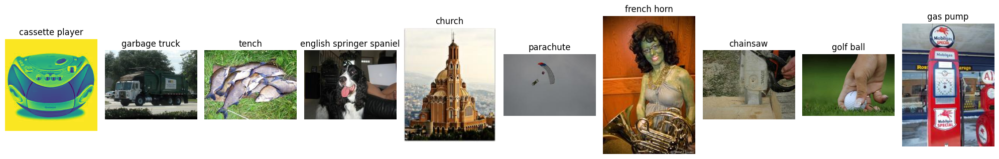

In [3]:
# For example of the images:
# Display one image from each class
int_to_label = df_data.drop_duplicates('labels').set_index('labels')['label'].to_dict()
unique_labels = df_data['label'].unique()

fig, axs = plt.subplots(1, len(unique_labels), figsize=(20, 5))

for i, label in enumerate(unique_labels):
    img_path = df_data[df_data['label'] == label]['img_path'].iloc[0]

    if os.path.exists(img_path):
        img = Image.open(img_path)
        axs[i].imshow(img)
        axs[i].set_title(label)
        axs[i].axis('off')
    else:
        axs[i].text(0.5, 0.5, 'Image not found', horizontalalignment='center', verticalalignment='center')
        axs[i].set_title(label)
        axs[i].axis('off')

plt.tight_layout()
plt.show()

Let us see how well the AI does on each of the classes!

In [4]:

print(f'Overall Accuracy of AI is {np.mean(df_data["preds"] == df_data["labels"]).round(3)}')
# accuracy by class
accuracy_by_class = df_data.groupby('label').apply(lambda x: np.mean(x['preds'] == x['labels'])).round(3)
print(f'\nAccuracy by class: {accuracy_by_class}')

Overall Accuracy of AI is 0.584

Accuracy by class: label
cassette player             0.605
chainsaw                    0.676
church                      0.372
english springer spaniel    0.084
french horn                 0.091
garbage truck               0.653
gas pump                    0.726
golf ball                   0.882
parachute                   0.826
tench                       0.941
dtype: float64


/tmp/ipykernel_36500/2858943029.py:3: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  accuracy_by_class = df_data.groupby('label').apply(lambda x: np.mean(x['preds'] == x['labels'])).round(3)


# IntegrAI Demo for Model Error

We will use IntegrAI to check regions of data where the AI performs really well.

To instantiate an instance of IntegrAI, we need to provide the following arguments:

        embeddings: np.array, embedding of the examples (each row is an example)

        descriptions: list of str, the descriptions of the points

        embedding_func: function, the function to get the embedding of the text - given a string, returns a vector embedding, the embedding should live in the same space of the embeddings

        model1_losses: 1d array of floats, loss of the first model on each data point (lower is better)

        model2_losses: 1d array of floats,loss of the second model on each data point (lower is better) - optional

        mode: (string) 'single' (model error) or 'double' (compare two models) - optional, default is single

Here we will use the CLIP model to get the text embeddings. We will use the 0-1 loss for the model losses.

We have only one model and we are not interested in comparing two models, so we will use the default mode 'single'.

In [5]:
# get model loss on each point - here we use the 0-1 loss
model_losses = loss_01_pointwise(df_data['preds'], df_data['labels'])
integrai = IntegrAI(np.array(df_data['image_embeddings'].to_list()), df_data['captions'].to_list(), get_text_embeddings_clip, model_losses)

We are going to find 2 regions of maximium size 5% of the data where the model performs badly.


We will use the method discover_regions of IntegrAI 

    Args:

        loss_threshold: (only used in "single" mode) threshold on loss to denote if a loss of an example is high or low (binarize the loss). If you are using as your loss metric misclassification error, you should set this to 0.5

        prior: predictions of the prior rejector (1d binary array where 1 is model2 better than model1 and 0 otherwise), can also use:

        "all_1": all 1s prior (model2 better than model1 on all points) or
        
        "all_0": all 0s prior (model1 better than model2),
        
        or "mix": random mix of 1s and 0s (0.5 probability of 1)
        
        in mode "single": "all_1" means our prior is that model1 has loss higher than loss_threshold on all points, "all_0" means model1 has loss lower than loss_threshold, "mix" means that we are unsure about the prior

        number_regions: maximum number of regions to find (default to 1)

        max_size: maximum size of region as fraction of data (in [0,1])

        min_size: minimum size of region as fraction of data (in [0,1])
      

Additional arguments are described in integrai_discover

In [6]:
_ = integrai.discover_regions(prior = "all_1", loss_threshold=0.5, number_regions = 2, max_size = 0.05, min_size = 0.001)

  0%|          | 0/4 [00:00<?, ?it/s]/workspaces/onboarding_human_ai/integrai/integrai_discover.py:340: UserWarning: Creating a tensor from a list of numpy.ndarrays is extremely slow. Please consider converting the list to a single numpy.ndarray with numpy.array() before converting to a tensor. (Triggered internally at ../torch/csrc/utils/tensor_new.cpp:275.)
  initial_teaching_point = torch.FloatTensor([self.initial_teaching_points[itt]])
/workspaces/onboarding_human_ai/integrai/integrai_discover.py:166: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  agreement_with_opt = torch.tensor(torch.zeros(len(self.data_x))).to(self.device)
/workspaces/onboarding_human_ai/integrai/integrai_discover.py:166: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_

In [7]:
# which points are in the region? 0 is background region always
region_labels = integrai.region_finder.get_region_labels(df_data['image_embeddings'])
defer_preds = integrai.region_finder.get_defer_preds(df_data['image_embeddings'])
print(f' accuracy of AI in region 1 found is {np.mean(df_data["preds"][region_labels==1] == df_data["labels"][region_labels==1]) }')
print(f' accuracy of AI in region 2 found is {np.mean(df_data["preds"][region_labels==2] == df_data["labels"][region_labels==2]) }')
print(f' size of regions is {Counter(region_labels)}')

 accuracy of AI in region 1 found is 0.9949238578680203
 accuracy of AI in region 2 found is 0.9949238578680203
 size of regions is Counter({0.0: 3531, 2.0: 197, 1.0: 197})


Let us look at each of the regions

In [10]:
def visualize_region(region_id, num_rows_min = 5):
    image_names = df_data['img_path'].to_numpy()[region_labels==region_id]
    labels_imgs = df_data['label'].to_numpy()[region_labels==region_id]
    for i in range(len(image_names)):
        image_names[i] =  image_names[i]
    num_cols = 5
    num_rows =  (len(image_names) + num_cols - 1) // num_cols
    num_rows = min(num_rows_min, num_rows)

    fig, axes = plt.subplots(num_rows, num_cols, figsize=(num_cols * 3, num_rows * 3))
    axes = axes.flatten()

    for i in range(num_rows * num_cols):
        image_data = mpimg.imread(image_names[i])
        axes[i].imshow(image_data, interpolation='none')
        axes[i].axis('off')

    for i in range(len(image_names), len(axes)):
        axes[i].axis('off')
    plt.tight_layout()
    plt.show()

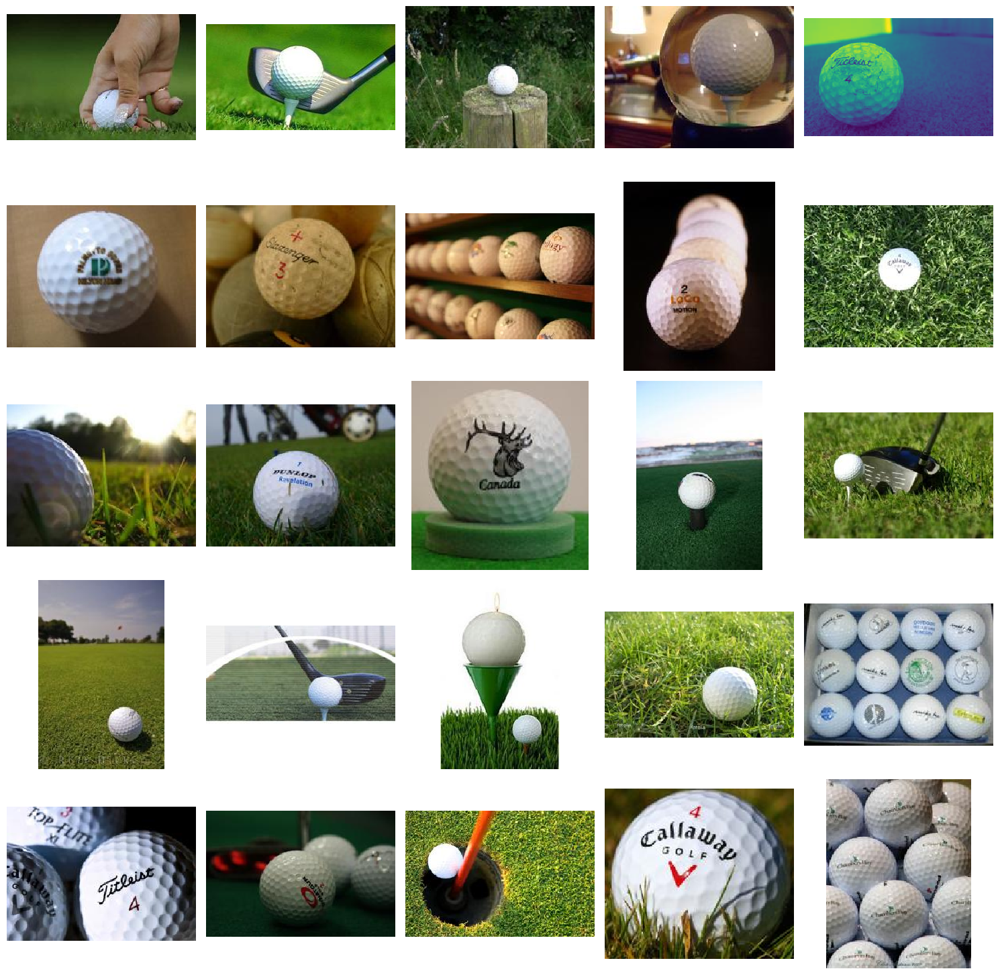

In [9]:
visualize_region(1)

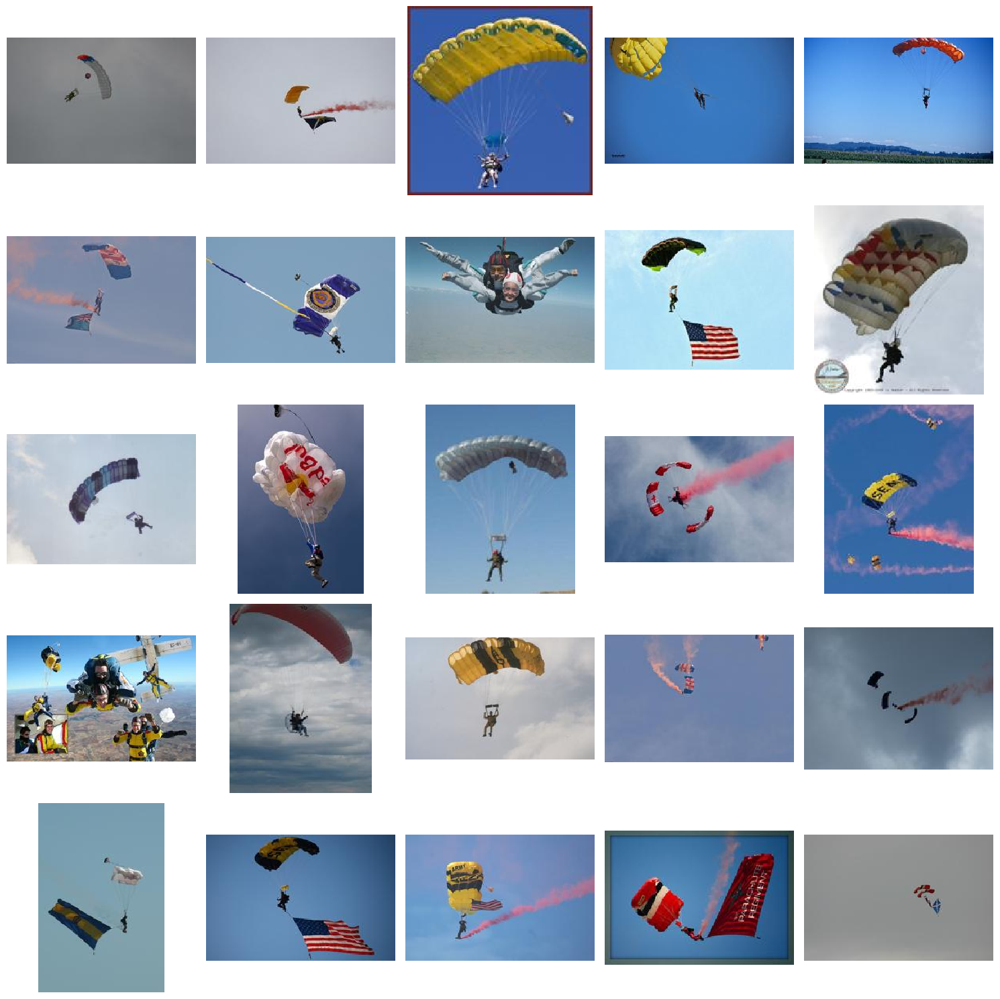

In [10]:
visualize_region(2)

It seems that one of the regions consists of close up of golf balls while the other consists of images of paruchutes.

Instead of manually looking at the regions and describing, IntegrAI can do this for us!

In [11]:
# make sure to set your openai key
openai.api_key = "sk-"


In [12]:
description, _, _, _ = integrai.describe_region(1)
print(f'IntegrAI has described region 1 as: {description}')

IntegrAI has described region 1 as: The region includes images of various golf balls in a golfing setting, excluding unrelated objects or people playing golf.


In [14]:
description, _, _, _ = integrai.describe_region(2)
print(f'IntegrAI has described region 2 as: {description}')

IntegrAI has described region 2 as: The region includes images of people parasailing and flying kites in the sky, with no scenes on land or ocean.


# Incorporating a Prior

When we say the accuracy of the AI by class, we can already see some significant differences:


Accuracy by class:
cassette player             0.605

chainsaw                    0.676

church                      0.372

english springer spaniel    0.084

french horn                 0.091

garbage truck               0.653

gas pump                    0.726

golf ball                   0.882

parachute                   0.826

tench                       0.941

The IntegrAI allows us to incorporate our prior on where the AI is correct or incorrect (or where model1 is better than model2).

We will use a prior where we say the AI is incorrect if class accuracy is below 0.6 and not otherwise

In [6]:
prior = np.zeros(len(df_data))
accuracy_by_class = df_data.groupby('label').apply(lambda x: np.mean(x['preds'] == x['labels'])).round(3)
for i in range(len(prior)):
    label_i = df_data['label'][i]
    if accuracy_by_class[label_i] < 0.6:
        prior[i] = 1


/tmp/ipykernel_44891/462403091.py:2: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  accuracy_by_class = df_data.groupby('label').apply(lambda x: np.mean(x['preds'] == x['labels'])).round(3)


In [7]:
_ = integrai.discover_regions(prior = prior, loss_threshold=0.5, number_regions = 1, max_size = 0.05, min_size = 0.01)

  0%|          | 0/2 [00:00<?, ?it/s]/workspaces/onboarding_human_ai/integrai/integrai_discover.py:340: UserWarning: Creating a tensor from a list of numpy.ndarrays is extremely slow. Please consider converting the list to a single numpy.ndarray with numpy.array() before converting to a tensor. (Triggered internally at ../torch/csrc/utils/tensor_new.cpp:275.)
  initial_teaching_point = torch.FloatTensor([self.initial_teaching_points[itt]])
/workspaces/onboarding_human_ai/integrai/integrai_discover.py:166: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  agreement_with_opt = torch.tensor(torch.zeros(len(self.data_x))).to(self.device)


/workspaces/onboarding_human_ai/integrai/integrai_discover.py:166: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  agreement_with_opt = torch.tensor(torch.zeros(len(self.data_x))).to(self.device)
  0%|          | 0/2 [00:55<?, ?it/s]

Found 1 regions


In [8]:
region_labels = integrai.region_finder.get_region_labels(df_data['image_embeddings'])
defer_preds = integrai.region_finder.get_defer_preds(df_data['image_embeddings'])
print(f' accuracy of AI in region 1 found is {np.mean(df_data["preds"][region_labels==1] == df_data["labels"][region_labels==1]) }')
print(f' size of regions is {Counter(region_labels)}')
print(df_data['label'][region_labels==1].value_counts())

 accuracy of AI in region 1 found is 0.9827586206896551
 size of regions is Counter({0.0: 3809, 1.0: 116})
label
church    116
Name: count, dtype: int64


We can see we found a subset of the class church, which the model has accuracy 37% on, where the model is almost perfect on! This contradicts our prior, let us look at this subset:

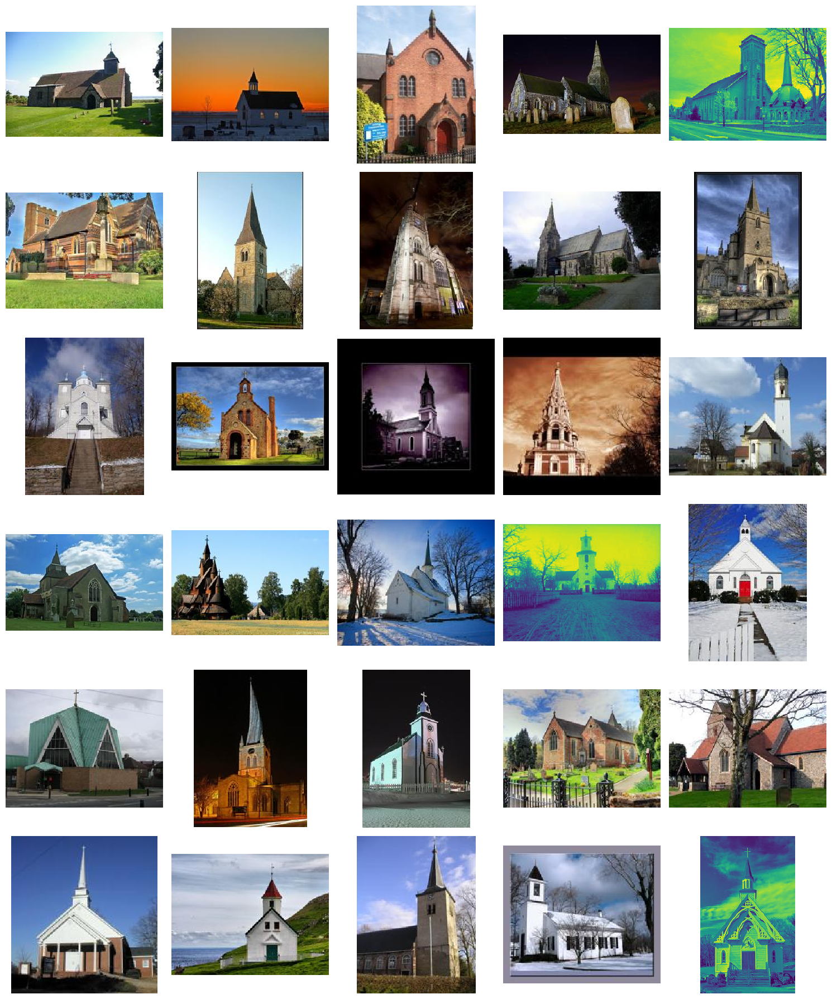

In [11]:
visualize_region(1, num_rows_min = 6)

For comparision, let us look at images in the class church which is not in the region

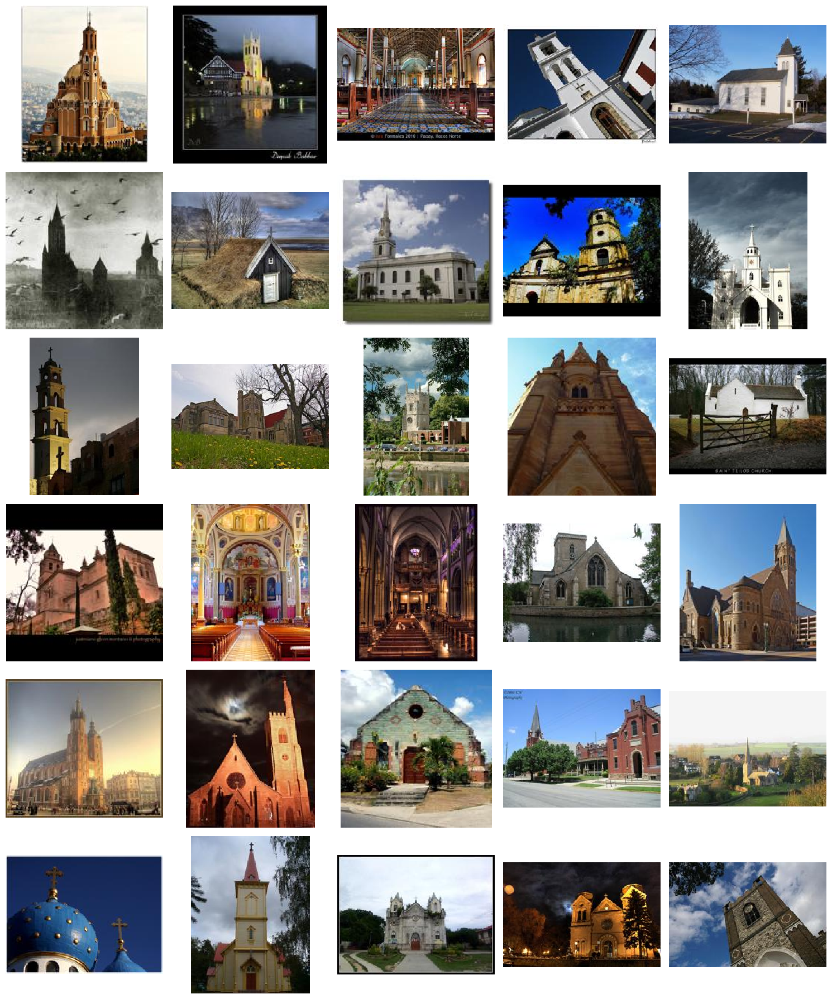

In [12]:
# set region_labels to 2 if the class is church and region_labels is not 1
for i in range(len(region_labels)):
    if df_data['label'][i] == 'church' and region_labels[i] != 1:
        region_labels[i] = 2
visualize_region(2, num_rows_min = 6)

The difference we can observe is that the region we found has clear pictures of the outside churches which are centered and at a distance (no close-ups, no inside of churches)

# Comparing Two Models

We will do a simple illustration of how to use IntegrAI to compare two models.

Our first model is the AI we have been using.

For example purposes, the second model is assumed to be perfect on all classes except class 1.

We expect the region we will discover is to not trust model2 on class 1

In [13]:
# get model loss on each point - here we use the 0-1 loss
model_losses = loss_01_pointwise(df_data['preds'], df_data['labels'])
# model2_losses is 0 except on class 1
model2_losses = df_data['labels'] == 1

integrai = IntegrAI(np.array(df_data['image_embeddings'].to_list()), df_data['captions'].to_list(), get_text_embeddings_clip, model_losses, model2_losses, "double")

In [14]:
_ = integrai.discover_regions(prior = "all_1", loss_threshold=0.5, number_regions = 1, max_size = 0.1, min_size = 0.001)

  0%|          | 0/2 [00:00<?, ?it/s]/workspaces/onboarding_human_ai/integrai/integrai_discover.py:166: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  agreement_with_opt = torch.tensor(torch.zeros(len(self.data_x))).to(self.device)


In [1]:
region_labels = integrai.region_finder.get_region_labels(df_data['image_embeddings'])
defer_preds = integrai.region_finder.get_defer_preds(df_data['image_embeddings'])
print(f' accuracy of AI in region 1 found is {np.mean(df_data["preds"][region_labels==1] == df_data["labels"][region_labels==1]) }')
print(f' size of regions is {Counter(region_labels)}')
print(df_data['label'][region_labels==1].value_counts())

NameError: name 'integrai' is not defined